# Handin Exercise 6

Create a module containing a class: TextComparer with the following methods:
1. `__init__(self, url_list)`
2. `download(url,filename)` that stores the file on disk and raises NotFoundException when url returns 404
3. `multi_download()` uses threads to download multiple urls as text and stores filenames on a property of the TextComparer class object (Hint: use the download() method and create the filenames from the url or from the response object)
4. `__iter__()` returns an iterator
5. `__next__()` returns the next filename (and stops when there are no more)
6. `urllist_generator()` returns a generator to loop through the urls
7. `avg_vowels(text)` - a rough estimate on readability returns average number of vowels in the words of the text
8. `hardest_read()` reads all text from files in `filenames` and returns the filename of the text with the highest vowel score (use all the cpu cores on the computer for this work.

### Ex 2
Create a notebook and import your module from above
1. Find 10 books on https://www.gutenberg.org/browse/scores/top and download them using an object of the class you just created before
2. Test the different methods of your class
3. Make a bar plot with a sorted list of books on x-axis and avg vowels on y-axis

In [1]:
import requests

In [2]:
from modules import TextComparer

In [3]:
import imp

In [4]:
# Reload module
imp.reload(TextComparer)

<module 'modules.TextComparer' from '/home/jovyan/my_notebooks/python_handin_template/modules/TextComparer.py'>

## download(url,filename)

In [5]:
book_list = ['https://www.gutenberg.org/files/84/84-0.txt', 'https://www.gutenberg.org/files/1342/1342-0.txt', 'https://www.gutenberg.org/files/25344/25344-0.txt', 'https://www.gutenberg.org/files/11/11-0.txt', 'https://www.gutenberg.org/files/1952/1952-0.txt', 'https://www.gutenberg.org/files/345/345-0.txt', 'https://www.gutenberg.org/files/2701/2701-0.txt', 'https://www.gutenberg.org/files/2542/2542-0.txt', 'https://www.gutenberg.org/files/1080/1080-0.txt', 'https://www.gutenberg.org/files/1661/1661-0.txt']

In [6]:
textComparer = TextComparer.TextComparer(book_list)

In [7]:
# filenmae is set
textComparer.download('https://stackoverflow.com/questions/1125968/git-how-do-i-force-git-pull-to-overwrite-local-files', 'stackoverflow')

'stackoverflow.txt'

In [8]:
# Page 404 exeption
textComparer.download('https://stackoverflow.com/questi', 'stackoverflow.txt')

Exception occurred with status code: 404


In [9]:
# Filename not set
textComparer.download('https://stackoverflow.com/questions/1125968/git-how-do-i-force-git-pull-to-overwrite-local-files')

'stackoverflow-com-git-how-do-i-force-git-pull-to-overwrite-local-files.txt'

## multi_download()

In [10]:
multi_download_list = textComparer.multithreading(textComparer.download)

In [11]:
print(multi_download_list)

['www-gutenberg-org-84-0-txt.txt', 'www-gutenberg-org-1342-0-txt.txt', 'www-gutenberg-org-25344-0-txt.txt', 'www-gutenberg-org-11-0-txt.txt', 'www-gutenberg-org-1952-0-txt.txt', 'www-gutenberg-org-345-0-txt.txt', 'www-gutenberg-org-2701-0-txt.txt', 'www-gutenberg-org-2542-0-txt.txt', 'www-gutenberg-org-1080-0-txt.txt', 'www-gutenberg-org-1661-0-txt.txt']


In [12]:
read_dict = textComparer.read_files_from_list(multi_download_list)

In [13]:
read_dict

{'www-gutenberg-org-84-0-txt.txt': '\ufeffThe Project Gutenberg eBook of Frankenstein, by Mary Wollstonecraft (Godwin) Shelley\n\nThis eBook is for the use of anyone anywhere in the United States and\nmost other parts of the world at no cost and with almost no restrictions\nwhatsoever. You may copy it, give it away or re-use it under the terms\nof the Project Gutenberg License included with this eBook or online at\nwww.gutenberg.org. If you are not located in the United States, you\nwill have to check the laws of the country where you are located before\nusing this eBook.\n\nTitle: Frankenstein\n       or, The Modern Prometheus\n\nAuthor: Mary Wollstonecraft (Godwin) Shelley\n\nRelease Date: 31, 1993 [eBook #84]\n[Most recently updated: November 13, 2020]\n\nLanguage: English\n\nCharacter set encoding: UTF-8\n\nProduced by: Judith Boss, Christy Phillips, Lynn Hanninen, and David Meltzer. HTML version by Al Haines.\nFurther corrections by Menno de Leeuw.\n\n*** START OF THE PROJECT GUTE

## __iter__() returns an iterator

In [14]:
my_iterator = iter(textComparer)

## __next__()

In [15]:
next(my_iterator)

'https://www.gutenberg.org/files/84/84-0.txt'

In [16]:
next(my_iterator)

'https://www.gutenberg.org/files/1342/1342-0.txt'

In [17]:
next(my_iterator)

'https://www.gutenberg.org/files/25344/25344-0.txt'

## urllist_generator()

In [18]:
generated_list = textComparer.urllist_generator()

In [19]:
print(next(generated_list))

https://www.gutenberg.org/files/84/84-0.txt


In [20]:
print(next(generated_list))

https://www.gutenberg.org/files/1342/1342-0.txt


In [21]:
#print(next(generated_list))

## avg_vowels(text)

In [22]:
avg_vowel_dict = textComparer.read_vowel(read_dict)

In [23]:
avg_vowel_dict

{'www-gutenberg-org-84-0-txt.txt': 1.910711790515049,
 'www-gutenberg-org-1342-0-txt.txt': 1.1921051481513854,
 'www-gutenberg-org-25344-0-txt.txt': 1.8471904459590576,
 'www-gutenberg-org-11-0-txt.txt': 1.7555045202682997,
 'www-gutenberg-org-1952-0-txt.txt': 1.8224837857314438,
 'www-gutenberg-org-345-0-txt.txt': 1.6320560388945753,
 'www-gutenberg-org-2701-0-txt.txt': 1.8874779934030799,
 'www-gutenberg-org-2542-0-txt.txt': 1.7743495008254069,
 'www-gutenberg-org-1080-0-txt.txt': 1.9958165997322623,
 'www-gutenberg-org-1661-0-txt.txt': 1.7744152239989428}

## hardest_read()

In [24]:
dict_to_list = []

for key, value in read_dict.items():
    extracted_list = [key, value]
    dict_to_list.append(extracted_list)

In [25]:
dict_to_list

[['www-gutenberg-org-84-0-txt.txt',
  '\ufeffThe Project Gutenberg eBook of Frankenstein, by Mary Wollstonecraft (Godwin) Shelley\n\nThis eBook is for the use of anyone anywhere in the United States and\nmost other parts of the world at no cost and with almost no restrictions\nwhatsoever. You may copy it, give it away or re-use it under the terms\nof the Project Gutenberg License included with this eBook or online at\nwww.gutenberg.org. If you are not located in the United States, you\nwill have to check the laws of the country where you are located before\nusing this eBook.\n\nTitle: Frankenstein\n       or, The Modern Prometheus\n\nAuthor: Mary Wollstonecraft (Godwin) Shelley\n\nRelease Date: 31, 1993 [eBook #84]\n[Most recently updated: November 13, 2020]\n\nLanguage: English\n\nCharacter set encoding: UTF-8\n\nProduced by: Judith Boss, Christy Phillips, Lynn Hanninen, and David Meltzer. HTML version by Al Haines.\nFurther corrections by Menno de Leeuw.\n\n*** START OF THE PROJECT G

In [26]:
list_of_dicts = textComparer.multiprocess(textComparer.hardest_read, dict_to_list)

In [27]:
list_of_dicts

[{'www-gutenberg-org-84-0-txt.txt': 1.910711790515049},
 {'www-gutenberg-org-1342-0-txt.txt': 1.1921051481513854},
 {'www-gutenberg-org-25344-0-txt.txt': 1.8471904459590576},
 {'www-gutenberg-org-11-0-txt.txt': 1.7555045202682997},
 {'www-gutenberg-org-1952-0-txt.txt': 1.8224837857314438},
 {'www-gutenberg-org-345-0-txt.txt': 1.6320560388945753},
 {'www-gutenberg-org-2701-0-txt.txt': 1.8874779934030799},
 {'www-gutenberg-org-2542-0-txt.txt': 1.7743495008254069},
 {'www-gutenberg-org-1080-0-txt.txt': 1.9958165997322623},
 {'www-gutenberg-org-1661-0-txt.txt': 1.7744152239989428}]

## Plot

In [30]:
import matplotlib.pyplot as plt
%matplotlib notebook

In [33]:
avg_vowel_dict = dict(sorted(avg_vowel_dict.items(), key=lambda item: item[1]))

In [34]:
avg_vowel_dict

{'www-gutenberg-org-1342-0-txt.txt': 1.1921051481513854,
 'www-gutenberg-org-345-0-txt.txt': 1.6320560388945753,
 'www-gutenberg-org-11-0-txt.txt': 1.7555045202682997,
 'www-gutenberg-org-2542-0-txt.txt': 1.7743495008254069,
 'www-gutenberg-org-1661-0-txt.txt': 1.7744152239989428,
 'www-gutenberg-org-1952-0-txt.txt': 1.8224837857314438,
 'www-gutenberg-org-25344-0-txt.txt': 1.8471904459590576,
 'www-gutenberg-org-2701-0-txt.txt': 1.8874779934030799,
 'www-gutenberg-org-84-0-txt.txt': 1.910711790515049,
 'www-gutenberg-org-1080-0-txt.txt': 1.9958165997322623}

<IPython.core.display.Javascript object>


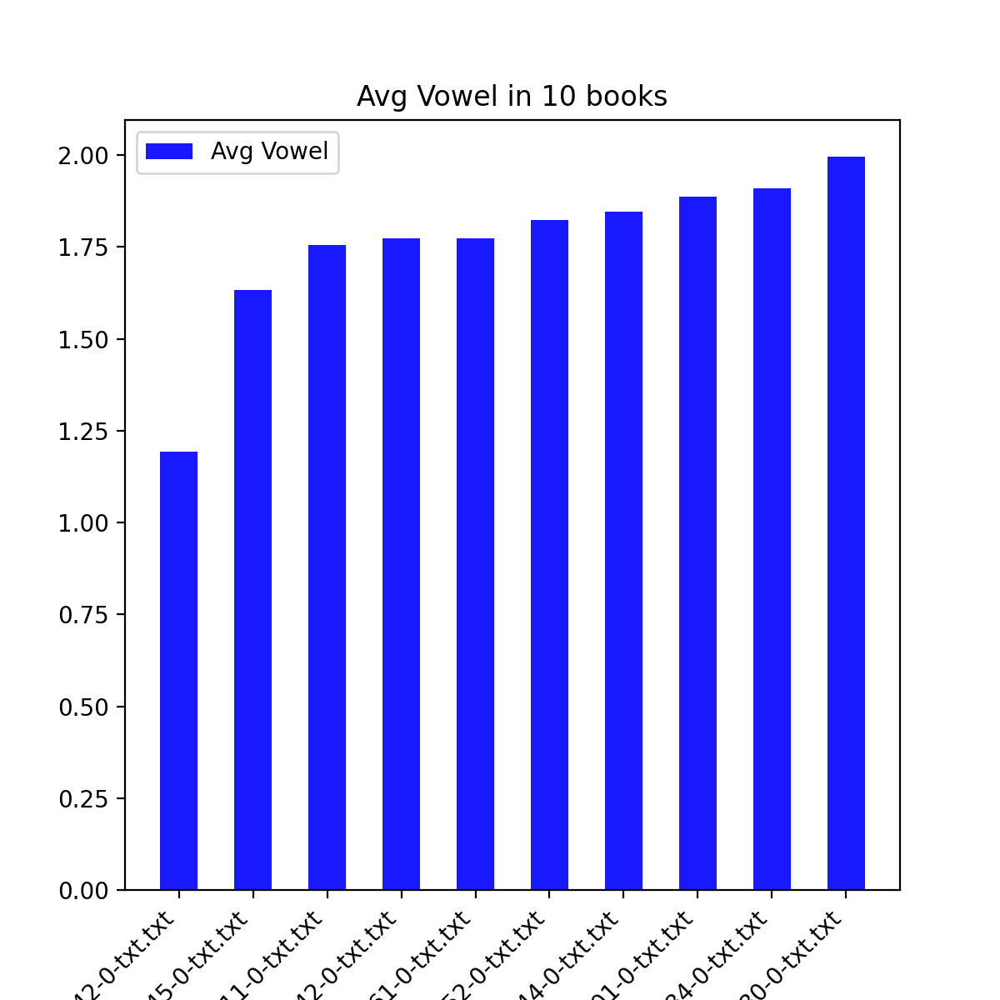

In [35]:
plt.figure(figsize = (6,6))
x_values = list(avg_vowel_dict.keys())
y1 = list(avg_vowel_dict.values())

plt.bar(x_values, y1, width=0.5, linewidth=0, align='center', color = 'blue', alpha = 0.9, label="Avg Vowel")

plt.title('Avg Vowel in 10 books', fontsize=12)
plt.tick_params(axis='both', which='major', labelsize=10)
plt.xticks(rotation=45, horizontalalignment='right',fontweight='light')
plt.legend()
plt.show()

### Print file content

In [28]:
context = open('stackoverflow.txt', mode='r')

In [29]:
print(context.read())

<!DOCTYPE html>


    <html itemscope itemtype="https://schema.org/QAPage" class="html__responsive ">

    <head>

        <title>version control - Git: How do I force &quot;git pull&quot; to overwrite local files? - Stack Overflow</title>
        <link rel="shortcut icon" href="https://cdn.sstatic.net/Sites/stackoverflow/Img/favicon.ico?v=ec617d715196">
        <link rel="apple-touch-icon" href="https://cdn.sstatic.net/Sites/stackoverflow/Img/apple-touch-icon.png?v=c78bd457575a">
        <link rel="image_src" href="https://cdn.sstatic.net/Sites/stackoverflow/Img/apple-touch-icon.png?v=c78bd457575a"> 
        <link rel="search" type="application/opensearchdescription+xml" title="Stack Overflow" href="/opensearch.xml">
        <link rel="canonical" href="https://stackoverflow.com/questions/1125968/git-how-do-i-force-git-pull-to-overwrite-local-files" />
        <meta name="viewport" content="width=device-width, height=device-height, initial-scale=1.0, minimum-scale=1.0">
        <meta p